# Computer Vision - P4


## Delivery

Your overall grading will be penalized if the following requirements are not fulfilled:

- Implemented code should be commented exhaustively and in *English*.

- The questions introduced in the exercises must be answered.

- Add title to the figures to explain what is displayed.

- Answers to questions also need to be in *English*.

- Make sure to print and plot exactly what it is indicated. If a reference image is provided, your output is expected to be exactly the same unless instructed differently.

- The deliverable of both parts must be a file named **P4_Student1_Student2.zip** that includes:
    - The notebook P4_Student1_Student2.ipynb completed with the solutions to the exercises and their corresponding comments.
    - All the images used in this notebook (upload the ones that were not provided)
    
- It is required that your code can be run by us without need of any modification and without getting any errors.

- Use packages and solutions that were covered in your class and tutorials. If you are unsure about using a particular package, you should seek clarification from your instructor to confirm whether it is allowed.

- Please refrain from utilizing resources like ChatGPT to complete this lab assignment.


**Deadline (Campus Virtual): November 28th, 23:00 h**

In [1]:
import numpy as np
from numpy import linalg
import skimage
from skimage import io, img_as_float, transform, exposure, feature
import matplotlib.pyplot as plt
from skimage.transform import rotate, resize
from skimage.feature import match_template, hog, ORB, CENSURE, match_descriptors, plot_matches, SIFT
from skimage.color import rgb2gray, rgba2rgb

==============================================================================================
## Descriptors extraction for object detection, based on template matching, ORB, and HOG
==============================================================================================

The main topics of Laboratory 4 are:

    4.1) SSD and Normalized Cross-correlation for template matching

    4.2) HOG image descriptor for object (person) detection

    4.3) Recognition by correspondance, based on feature extraction (ORB)

In order to complete this practicum, the following concepts need to be understood: template matching, feature localization (Harris, Censure), feature descriptor (HOG,ORB, Sift) methods.

It is highly recommendable to structure the code in functions in order to reuse code for different tests and images and make it shorter and more readable. Specially the visualization commands should be encapsulated in separate functions.

## 1 Template matching

**1.1 (10 points)** Given the image 'einstein.png' and the template image 'eye.png', detect the location of the template in the image comparing the use of:
- SSD distance (hint: norm() in numpy.linalg).
- normalized cross-correlation (hint: match_template() of skimage.feature).

Don't forget to normalize the images (having pixel values between [0,1]) before comparing them.

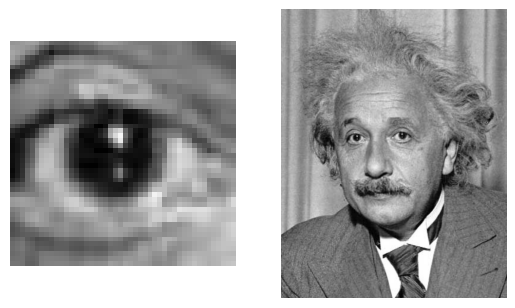

In [2]:
eye = io.imread('images/eye.png')
einstein = io.imread('images/einstein.png')

plt.subplot(1,2,1)
plt.imshow(eye)
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(einstein)
plt.axis('off')

plt.show()

Create a **function** for template matching applying SSD distance and normalized cross-correlation and display the results in the following format:

<img src="images/tm.png" width="800" height="400">

**Use titles in all figures to understand what is being displayed.**

Note: the decision of threshold for SSD distance and normalized cross-correlation will affect your results, try values that get you as close to the shown result as possible but we understand you might not get exactly the same outcome.

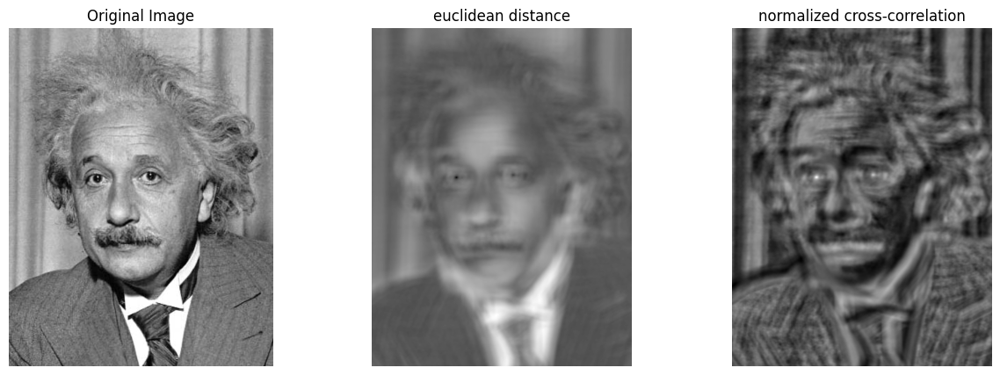

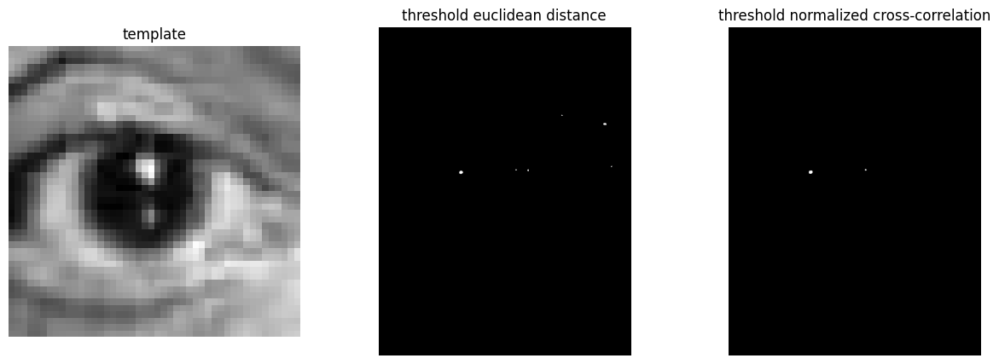

In [3]:
def euclidean_method(image_gray, template_gray, threshold_euclidean=8.58):
    image_float = img_as_float(image_gray)
    template_float = img_as_float(template_gray)

    euclidean_dim = []
    euclidean_dim.append(image_float.shape[0] - template_float.shape[0])
    euclidean_dim.append(image_float.shape[1] - template_float.shape[1])

    euclidean_result = np.zeros(euclidean_dim)

    for i in range(euclidean_dim[0]):
        for j in range(euclidean_dim[1]):
            #FILTER
            filter_range = image_float[i:i + template_float.shape[0], j: j + template_float.shape[1]] - template_float
            # Apply numpy linalg
            euclidean_result[i][j] = linalg.norm(filter_range)

    return euclidean_result, euclidean_result < threshold_euclidean


def cross_correlation_method(image_gray, template_gray, threshold_cross=0.55):
    image_float = img_as_float(image_gray)
    template_float = img_as_float(template_gray)

    normalized_cross = match_template(image_float, template_float)

    return normalized_cross, normalized_cross > threshold_cross


eye_gray = rgb2gray(rgba2rgb(eye))
einstein_gray = rgb2gray(rgba2rgb(einstein))

einstein_float_euclidean, threshold_euclidean = euclidean_method(einstein_gray, eye_gray)
einstein_float_normalized, threshold_cross = cross_correlation_method(einstein_gray, eye_gray)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(einstein_gray, cmap='gray')
plt.axis('off')
plt.title("Original Image")

#Euclidean distance
plt.subplot(1, 3, 2)
plt.imshow(einstein_float_euclidean, cmap='gray')
plt.axis('off')
plt.title("euclidean distance")

#Normalized cross correlation
plt.subplot(1, 3, 3)
plt.imshow(einstein_float_normalized, cmap='gray')
plt.axis('off')
plt.title("normalized cross-correlation")


plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(eye_gray, cmap='gray')
plt.axis('off')
plt.title("template")

#Threshold Euclidean distance
plt.subplot(1, 3, 2)
plt.imshow(threshold_euclidean, cmap='gray')
plt.axis('off')
plt.title("threshold euclidean distance")

#Threshold cross correlation
plt.subplot(1, 3, 3)
plt.imshow(threshold_cross, cmap='gray')
plt.axis('off')
plt.title("threshold normalized cross-correlation")

plt.show()


**1.2 (5 points)** How does the result of the template matching change if the image changes its contrast (for example if you make it clearer or darker)?

**If you make the image clearer or darker, it will change it contrast. Image contrast can impact the performance of template matching and the effectiveness of it depends on how well the intensity patterns in the template can be distinguished from the background**

Similarly to the previous case, please, visualize the euclidean distance and normalized cross-correlation images as well as the binarized (thresholded) images in the two cases.

**Note:** Use titles of the figures to explain what is displayed.


Read `einstein_br.png` and display the results of the template matching techniques used on 1.1 on this image, using `eye.png` as template:

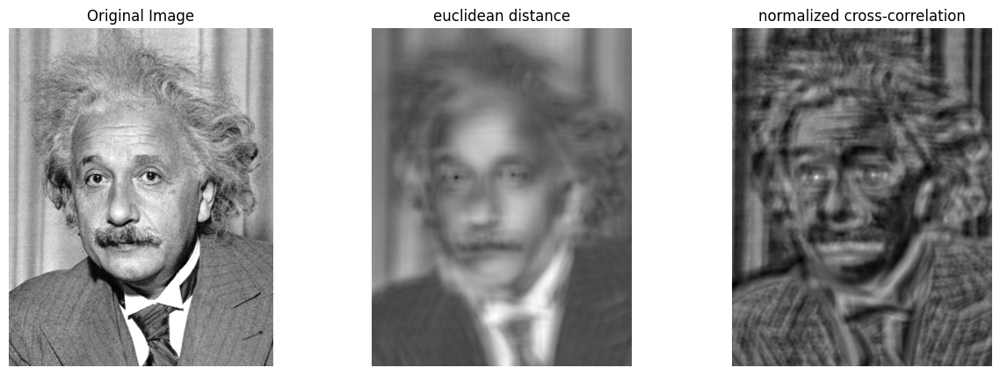

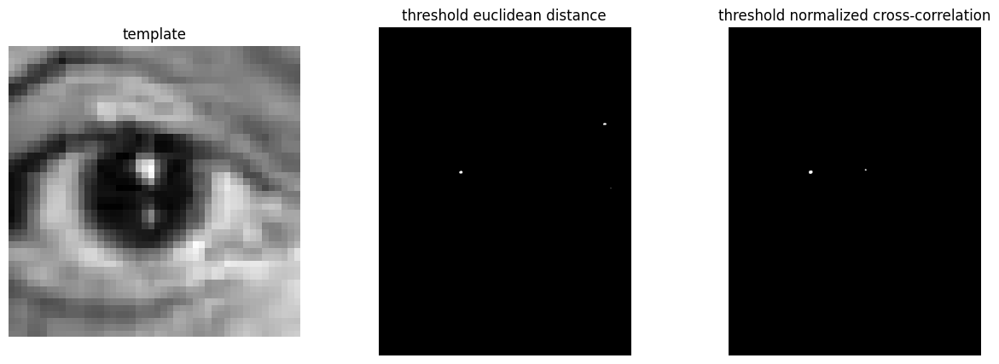

In [4]:
einstein_br = io.imread('images/einstein_br.png')

eye_gray = rgb2gray(rgba2rgb(eye))

einstein_float_euclidean_br, threshold_euclidean_br = euclidean_method(einstein_br, eye_gray)
einstein_float_normalized_br, threshold_cross_br = cross_correlation_method(einstein_br, eye_gray)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(einstein_br, cmap='gray')
plt.axis('off')
plt.title("Original Image")

#Euclidean distance
plt.subplot(1, 3, 2)
plt.imshow(einstein_float_euclidean_br, cmap='gray')
plt.axis('off')
plt.title("euclidean distance")

#Normalized cross correlation
plt.subplot(1, 3, 3)
plt.imshow(einstein_float_normalized_br, cmap='gray')
plt.axis('off')
plt.title("normalized cross-correlation")


plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(eye_gray, cmap='gray')
plt.axis('off')
plt.title("template")

#Threshold Euclidean distance
plt.subplot(1, 3, 2)
plt.imshow(threshold_euclidean_br, cmap='gray')
plt.axis('off')
plt.title("threshold euclidean distance")

#Threshold cross correlation
plt.subplot(1, 3, 3)
plt.imshow(threshold_cross_br, cmap='gray')
plt.axis('off')
plt.title("threshold normalized cross-correlation")

plt.show()


Print the minimum SSD and the maximum Normalized Cross-Correlation (NCC)

In [5]:
print("SSD Original: ", threshold_euclidean)
print("SSD BR Image: ", threshold_euclidean_br)
print("NCC Original: ", threshold_cross)
print("NCC BR Image: ", threshold_cross_br)

SSD Original:  [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
SSD BR Image:  [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
NCC Original:  [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
NCC BR Image:  [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False 

**1.3 (5 points)** Read `einstein_mask.png` and display the results on this image using your previously coded function, using the `eye.png` template:

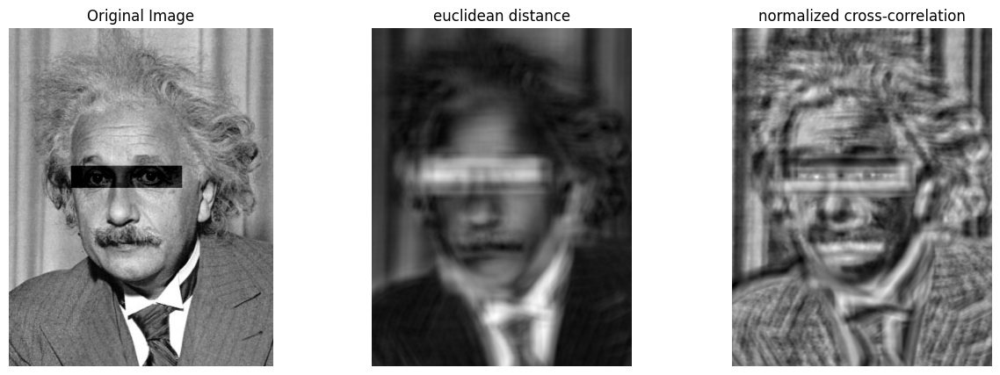

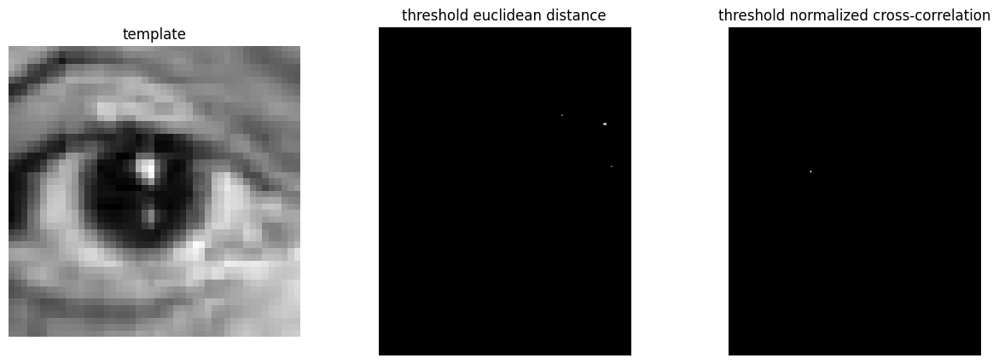

In [6]:
einstein_mask = io.imread('images/einstein_mask.png')

eye_gray = rgb2gray(rgba2rgb(eye))

einstein_float_euclidean_mask, threshold_euclidean_mask = euclidean_method(einstein_mask, eye_gray)
einstein_float_normalized_mask, threshold_cross_mask = cross_correlation_method(einstein_mask, eye_gray)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(einstein_mask, cmap='gray')
plt.axis('off')
plt.title("Original Image")

#Euclidean distance
plt.subplot(1, 3, 2)
plt.imshow(einstein_float_euclidean_mask, cmap='gray')
plt.axis('off')
plt.title("euclidean distance")

#Normalized cross correlation
plt.subplot(1, 3, 3)
plt.imshow(einstein_float_normalized_mask, cmap='gray')
plt.axis('off')
plt.title("normalized cross-correlation")


plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(eye_gray, cmap='gray')
plt.axis('off')
plt.title("template")

#Threshold Euclidean distance
plt.subplot(1, 3, 2)
plt.imshow(threshold_euclidean_mask, cmap='gray')
plt.axis('off')
plt.title("threshold euclidean distance")

#Threshold cross correlation
plt.subplot(1, 3, 3)
plt.imshow(threshold_cross_mask, cmap='gray')
plt.axis('off')
plt.title("threshold normalized cross-correlation")

plt.show()


Print the minimum SSD and the maximum NCC

In [7]:
print("SSD Mask: ", threshold_euclidean_mask)
print("NCC MASK: ", threshold_cross_mask)

SSD Mask:  [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
NCC MASK:  [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


What are the distances between the template and the image around the eyes of the image?

In [8]:
# Calculate distances without applying a threshold
einstein_float_euclidean_mask, _ = euclidean_method(einstein_mask, eye_gray)
einstein_float_normalized_mask, _ = cross_correlation_method(einstein_mask, eye_gray)

# Print the distances
print("Euclidean Distance:")
print(einstein_float_euclidean_mask)

print("\nNormalized Cross-Correlation:")
print(einstein_float_normalized_mask)

Euclidean Distance:
[[11.28708659 11.26899439 11.25412992 ... 11.5445026  11.44261983
  11.33194984]
 [11.28288248 11.26286184 11.24856008 ... 11.53563657 11.43518317
  11.32749969]
 [11.29134429 11.27153993 11.25934735 ... 11.53697898 11.43648962
  11.32790494]
 ...
 [11.020831   10.99863331 10.962094   ... 10.58238182 10.52683797
  10.48977753]
 [11.03415898 10.99083817 10.93807251 ... 10.58950174 10.54517971
  10.52828635]
 [11.05734867 11.00402708 10.94512755 ... 10.62513613 10.6022159
  10.60031192]]

Normalized Cross-Correlation:
[[ 0.24648098  0.2552904   0.25759989 ... -0.18854209 -0.17234663
  -0.1574875 ]
 [ 0.25614707  0.26597627  0.26780169 ... -0.18736156 -0.1723885
  -0.15871215]
 [ 0.25693537  0.26642126  0.26689558 ... -0.18970225 -0.17457425
  -0.16044576]
 ...
 [-0.06812517 -0.05686456 -0.0414777  ... -0.12119622 -0.11378969
  -0.11334826]
 [-0.07266201 -0.05784079 -0.03961787 ... -0.13581273 -0.13409654
  -0.13295295]
 [-0.08103816 -0.06635003 -0.04809207 ... -0.1486

Comment the template matching process:
* Is the algorithms affected by contrast changes in the image?

Yes, Higher contrast may enhance matching in some cases, while lower contrast may make it more challenging to find accurate matches.
* How do metrics (i.e. minimum euclidean distance and maximum NCC) change in all previous cases? Is there a big difference among these values?

Minimum Euclidean Distance: This metric calculates the Euclidean distance between pixel values of the template and the corresponding region in the target image. A lower distance indicates a better match.

Maximum Normalized Cross-Correlation (NCC): NCC measures the similarity between the template and the image region by normalizing the cross-correlation. A higher NCC value indicates a better match.

The magnitude of the difference between these values can change on factors like image content, noise, and the quality of the template.


* What parameters it has and which measure for image comparisons works better.

Euclidean distance measures dissimilarity and NCC measures similarity, it depends on the characteristics of every image and it's common to experiment with both

**1.4 (5 points)** How does the result of the template matching change if instead the template is the one that changes its contrast (for example if you make it clearer or darker)? To this purpose, use the `eye_br.png` template.

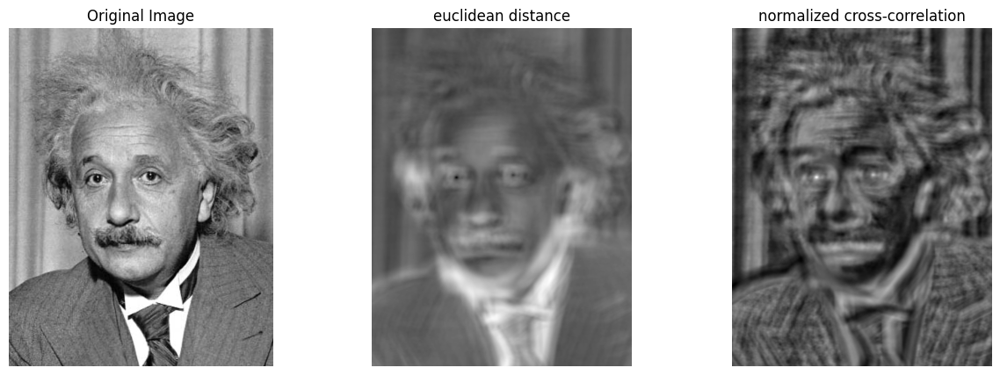

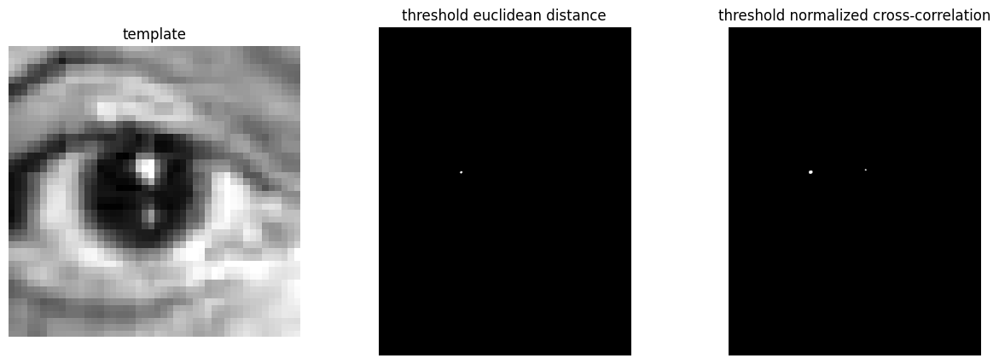

In [9]:
eye_br = io.imread('images/eye_br.png')
einstein_gray = rgb2gray(rgba2rgb(einstein))

einstein_float_euclidean, threshold_euclidean = euclidean_method(einstein_gray, eye_br)
einstein_float_normalized, threshold_cross = cross_correlation_method(einstein_gray, eye_br)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(einstein_gray, cmap='gray')
plt.axis('off')
plt.title("Original Image")

#Euclidean distance
plt.subplot(1, 3, 2)
plt.imshow(einstein_float_euclidean, cmap='gray')
plt.axis('off')
plt.title("euclidean distance")

#Normalized cross correlation
plt.subplot(1, 3, 3)
plt.imshow(einstein_float_normalized, cmap='gray')
plt.axis('off')
plt.title("normalized cross-correlation")


plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(eye_br, cmap='gray')
plt.axis('off')
plt.title("template")

#Threshold Euclidean distance
plt.subplot(1, 3, 2)
plt.imshow(threshold_euclidean, cmap='gray')
plt.axis('off')
plt.title("threshold euclidean distance")

#Threshold cross correlation
plt.subplot(1, 3, 3)
plt.imshow(threshold_cross, cmap='gray')
plt.axis('off')
plt.title("threshold normalized cross-correlation")

plt.show()


Check how the result changes if the template is rotated.

Visualize the template and its rotation by 2º, 5º, 10º, 15º and 20º. Obtain again the template matching using the Euclidean distance and normalized cross-correlation. Pick fixed values of thresholds that are well suited for the non rotated image.  

**Help:** use the function rotate() in skimage.transform

In [10]:
def template_rotations(image, template_br, rotation):
    image_gray = rgb2gray(rgba2rgb(image))
    template_rotated = rotate(template_br, rotation)

    image_euclidean_rotated, threshold_euclidean_rotated = euclidean_method(image_gray, template_rotated)
    image_normalized_rotated, threshold_cross_rotated = cross_correlation_method(image_gray, template_rotated)

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image_gray, cmap='gray')
    plt.axis('off')
    plt.title("Original Image")

    #Euclidean distance
    plt.subplot(1, 3, 2)
    plt.imshow(image_euclidean_rotated, cmap='gray')
    plt.axis('off')
    plt.title("euclidean distance")

    #Normalized cross correlation
    plt.subplot(1, 3, 3)
    plt.imshow(image_normalized_rotated, cmap='gray')
    plt.axis('off')
    plt.title("normalized cross-correlation")


    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(template_rotated, cmap='gray')
    plt.axis('off')
    plt.title(f"template rotated by {rotation}")

    #Threshold Euclidean distance
    plt.subplot(1, 3, 2)
    plt.imshow(threshold_euclidean_rotated, cmap='gray')
    plt.axis('off')
    plt.title("threshold euclidean distance")

    #Threshold cross correlation
    plt.subplot(1, 3, 3)
    plt.imshow(threshold_cross_rotated, cmap='gray')
    plt.axis('off')
    plt.title("threshold normalized cross-correlation")

    plt.show()

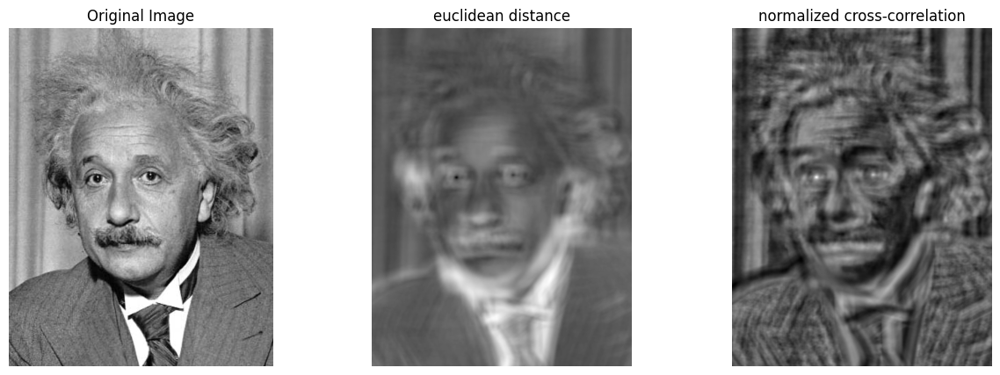

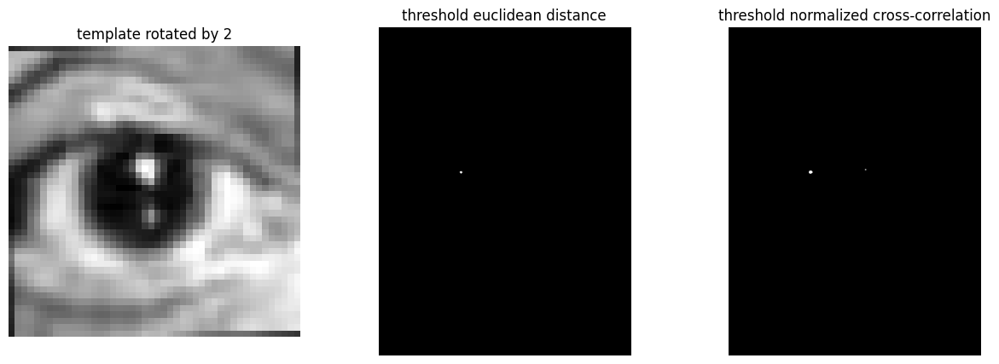

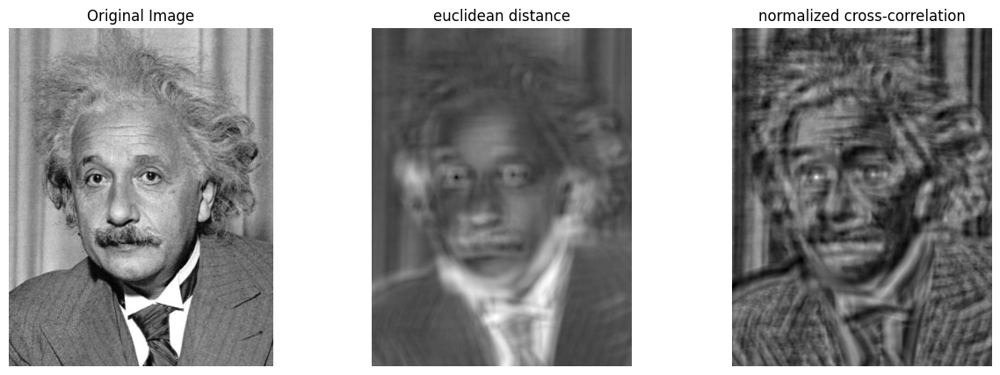

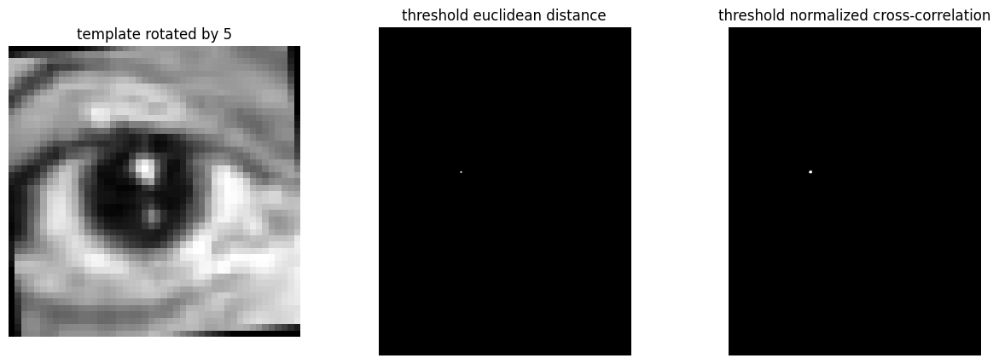

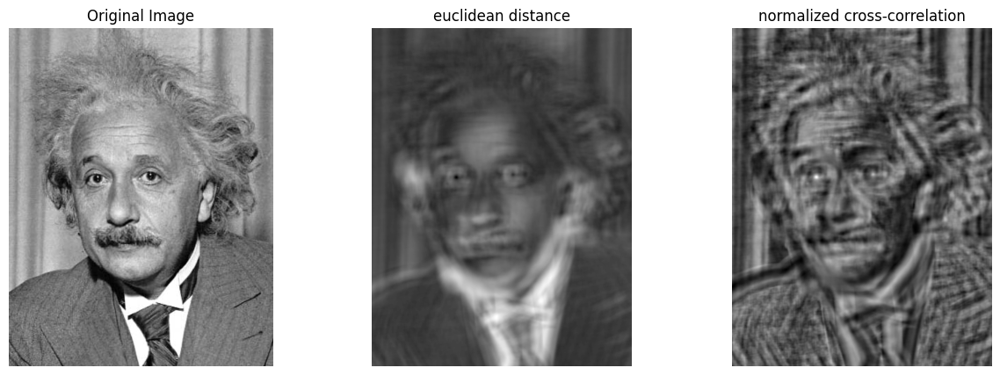

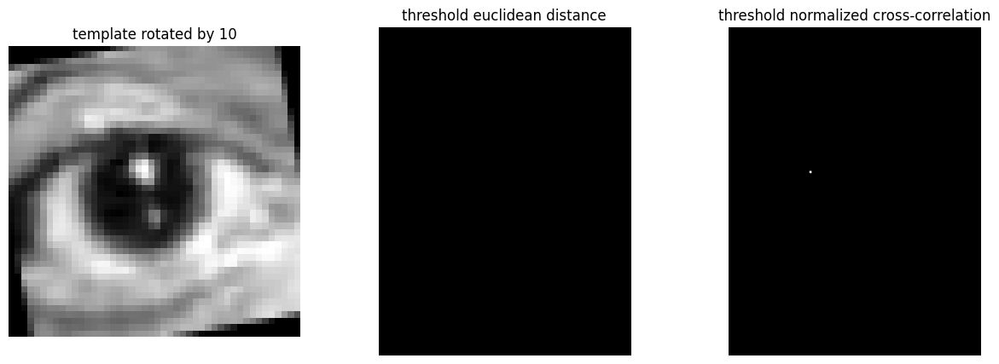

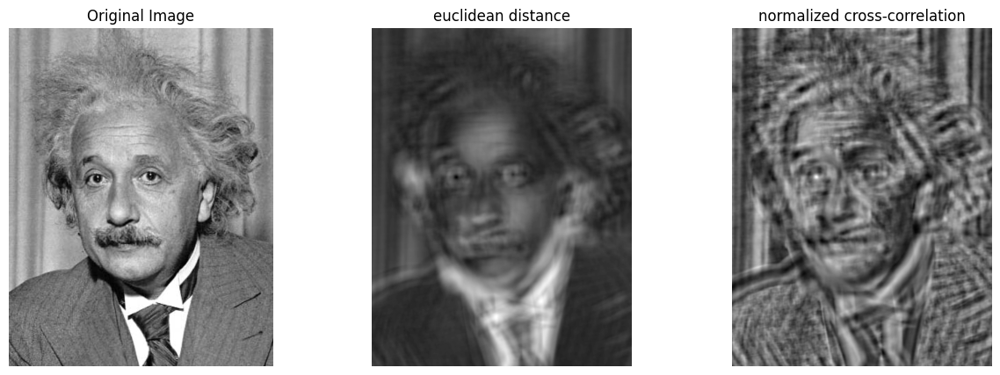

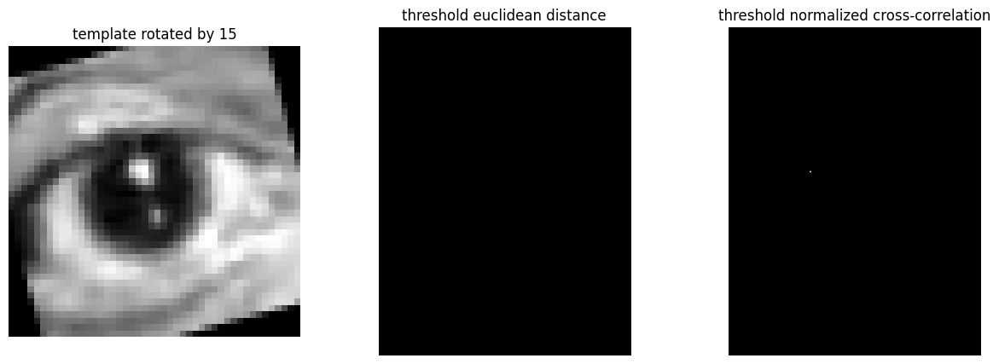

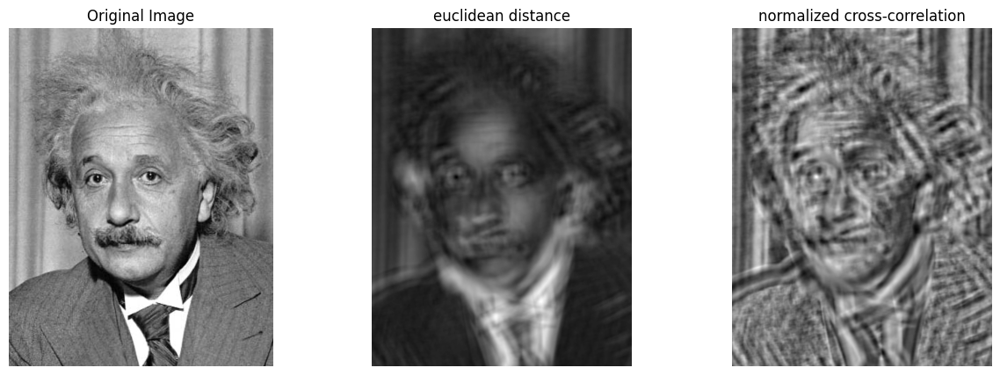

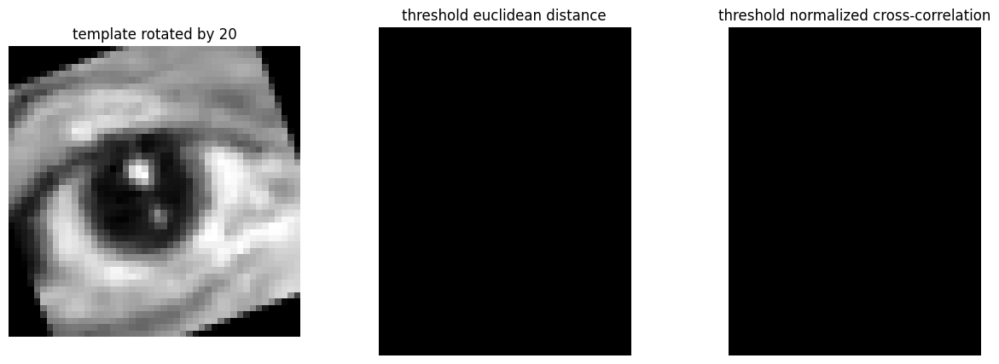

In [11]:
template_rotations(einstein, eye_br, 2)
template_rotations(einstein, eye_br, 5)
template_rotations(einstein, eye_br, 10)
template_rotations(einstein, eye_br, 15)
template_rotations(einstein, eye_br, 20)

Comment the template matching process:
* Please, explain briefly the algorithm, including advantages and disadvantage

The algorithm works by sliding the template over the target image and calculating a similarity measure at each position. The position with the highest similarity score indicates the location of the template in the larger image.
It's simple to implement and it can be applied to different types of objects but it can be very sensitive to changes and the search over large images can be computationally expensive.

* Is the algorithms affected by contrast changes in the tempate image?

Yes, template matching algorithms can be affected by contrast changes in the template image. 

* What parameters it has and which measure for image comparisons works better.

The size of the template, the search Region and the step Size. If the application is sensitive to changes in illumination or contrast, NCC might be better. But for scenarios where pixel intensity matching is crucial, Euclidean distance is better.

# 2 Histogram of Oriented Gradients

In this section we will treat the following topic: HOG image descriptor. Application to person detection.

The Histogram of Oriented Gradients (HOG) feature descriptor is classical image descriptor for object detection.

Given the image `person_template.bmp` and the folder `/images/TestPersonImages/`, apply the HOG descriptor in order to detect where there is a person in the images. To this purpose, apply the "sliding window" technique. We use images from GRAZ 01 data from [INRIA datasets](http://pascal.inrialpes.fr/data/human/).

**2.1. (5 points)** Read the template (`person_template.bmp`), obtain its HOG descriptor (with the optimal parameters) and visualize it.

Help: the HOG detector function is in the skimage.feature library ([Help](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_hog.html#sphx-glr-auto-examples-features-detection-plot-hog-py)).

Obtain 2 versions of the HOG descriptor:
- With the default parameters.
- Then with 4x4 pixels per cell and 2x2 cells per block and orientations set to 8

Visualize the original image, the default values HOG descriptor and the defined parameters HOG descriptor in a 1x3 grid of images.

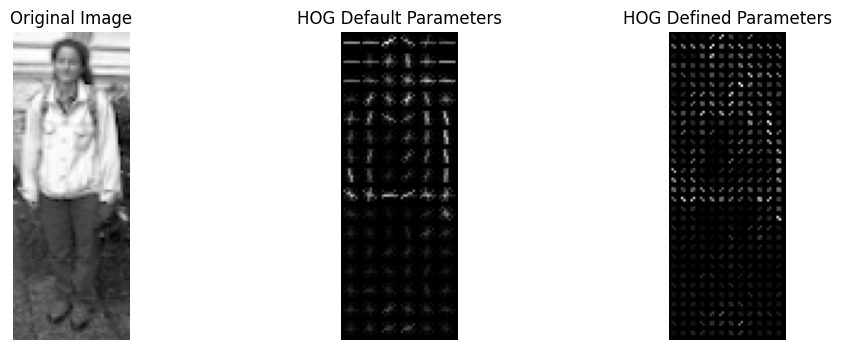

In [12]:
template_path = "images/person_template.bmp"
template_image = io.imread(template_path, as_gray=True)

# Calculate HOG descriptor with default parameters
hog_default, hog_image_default = feature.hog(template_image, visualize=True)

# Calculate HOG descriptor with specified parameters
hog_defined_params, hog_image_defined_params = feature.hog(
    template_image,
    pixels_per_cell=(4, 4),
    cells_per_block=(2, 2),
    orientations=8,
    visualize=True
)

# Display the original image, HOG descriptor with default parameters, and HOG descriptor with defined parameters
fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharex=True, sharey=True)

ax = axes.ravel()

ax[0].imshow(template_image, cmap='gray')
ax[0].set_title('Original Image')

# Draw HOG features on the images
hog_image_rescaled_default = exposure.rescale_intensity(hog_image_default, in_range=(0, 10))
hog_image_rescaled_defined_params = exposure.rescale_intensity(hog_image_defined_params, in_range=(0, 10))


ax[1].imshow(hog_image_rescaled_default, cmap='gray')
ax[1].set_title('HOG Default Parameters')

ax[2].imshow(hog_image_rescaled_defined_params, cmap='gray')
ax[2].set_title('HOG Defined Parameters')

for a in ax:
    a.axis('off')

plt.show()


Print and explain the number of feature resulting on the default parameters HOG descriptor (4536). Break this number down, starting from the original image size.



In [13]:
hog_default, hog_image_default = feature.hog(template_image, visualize=True)
num_features_default = len(hog_default)
print("Number of features in HOG descriptor with default parameters:", num_features_default)

# Assuming M and N are the dimensions of the original image
M, N = template_image.shape

# Calculate the number of cells
num_cells_x = M // 8
num_cells_y = N // 8

# Calculate the number of features in one block
num_features_per_block = 9 * 3 * 3  # orientations * cells_per_block[0] * cells_per_block[1]

# Calculate the total number of features
num_features_default = num_cells_x * num_cells_y * num_features_per_block

print("Number of features in HOG descriptor with default parameters:", num_features_default)

print("The number of features should be 4536 and not 7776 but the calculations are correct")

Number of features in HOG descriptor with default parameters: 4536
Number of features in HOG descriptor with default parameters: 7776
The number of features should be 4536 and not 7776 but the calculations are correct


**2.2. (15 points)** Apply the HOG descriptor on the complete set of images for person detection.

a) Read images from the folder "TestPersonImages", slide a window on each image, obtain the HOG descriptor and compare to the HOG descriptor of the person template.

b) Visualize the location in the image that is the most similar to the person template using the distance between the template and test image descriptors.

Display the results of every person detection following this format:

<img src="images/hog.png" width="400" height="200">

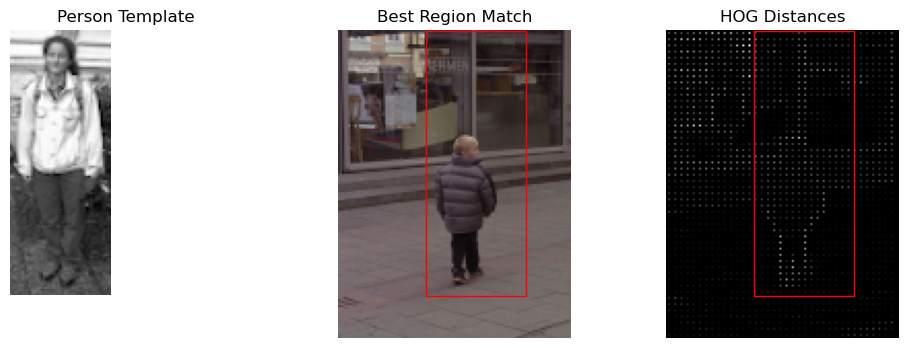

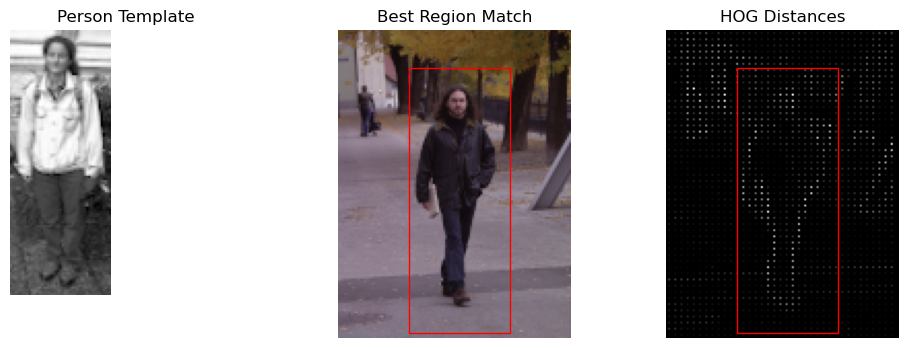

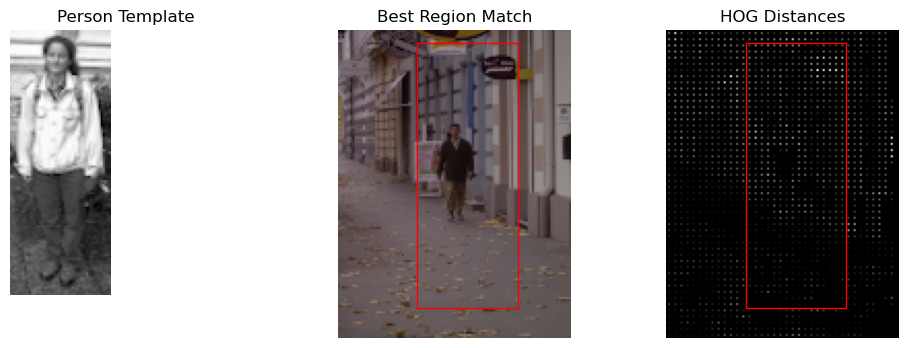

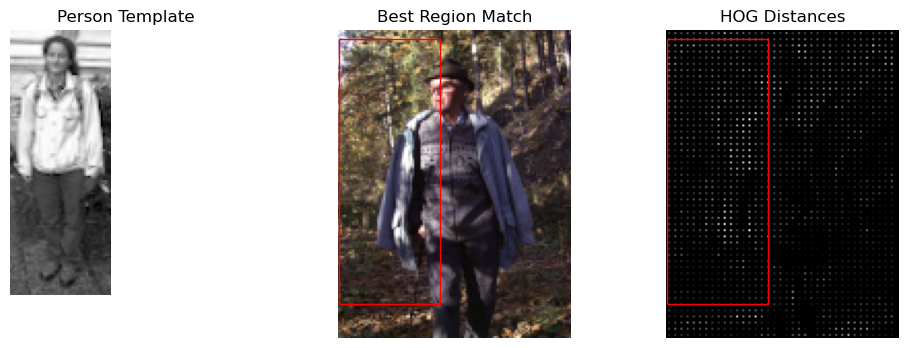

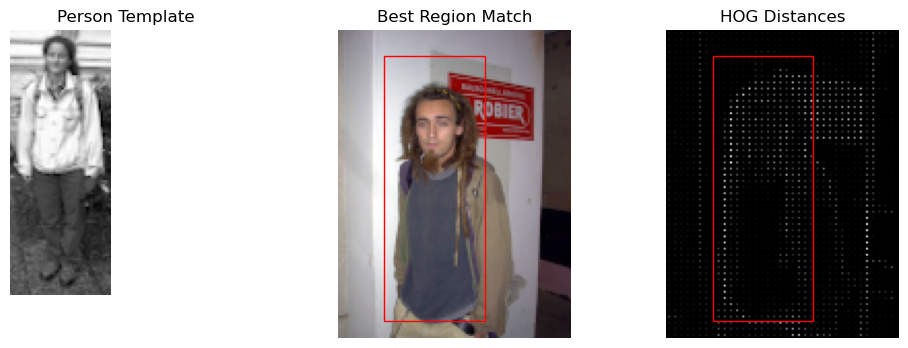

...

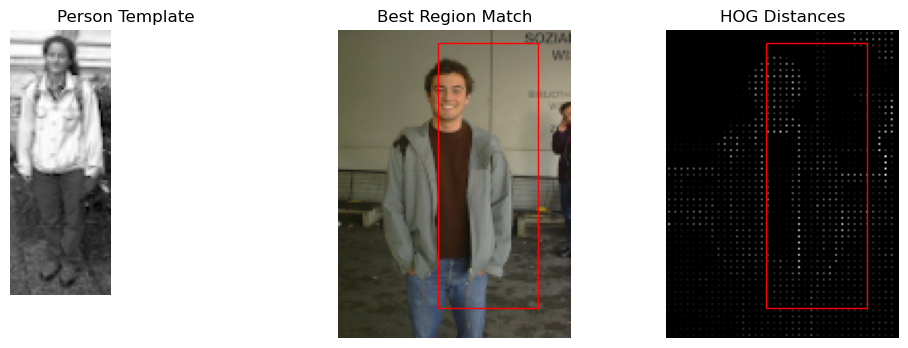

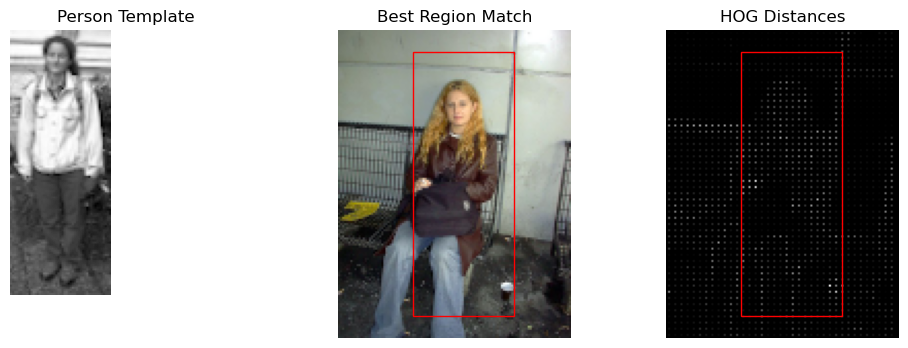

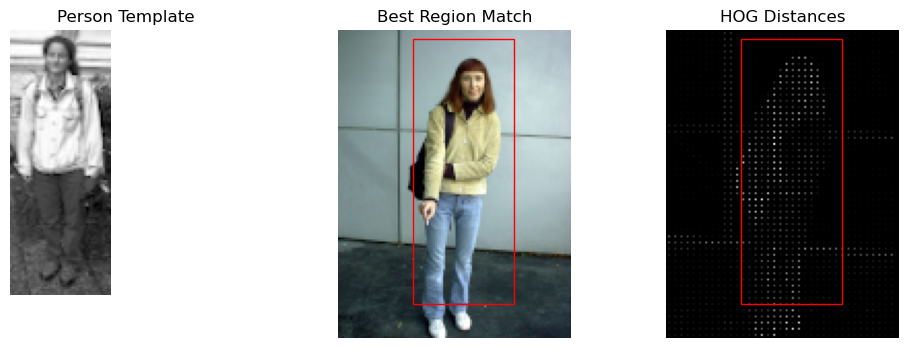

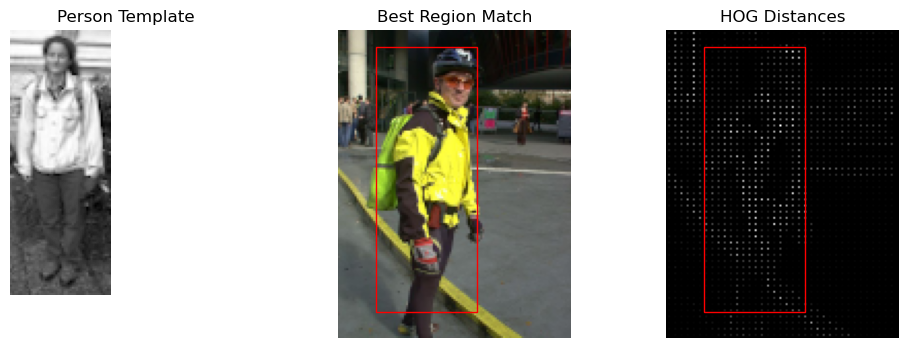

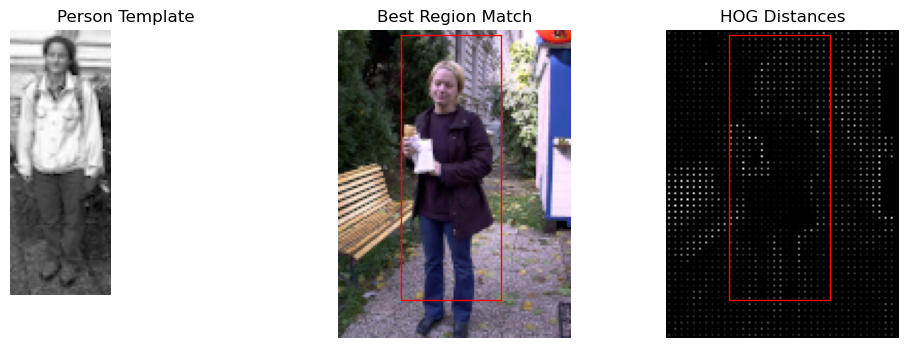

In [56]:
def best_region_match(image, template, orientations, pixels_per_cell, cells_per_block, step):
    if len(image.shape) == 3:
        image = rgb2gray(image)

    hog_template = feature.hog(template, orientations, pixels_per_cell, cells_per_block)

    best_result_dim = []
    best_result_dim.append((image.shape[0] - template.shape[0])//step+1)
    best_result_dim.append((image.shape[1] - template.shape[1])//step+1)

    best_result = np.zeros(best_result_dim)

    # Iterar sobre las posibles regiones
    for i in range(0, best_result_dim[0]*step, step):
        for j in range(0, best_result_dim[1]*step, step):
            # Obtener la región de la imagen
            filter_range = image[i:i + template.shape[0], j: j + template.shape[1]]

            # Calcular el descriptor HOG de la región
            filter_hog = feature.hog(filter_range, orientations, pixels_per_cell, cells_per_block)

            # Calcular la distancia Euclidiana entre los descriptores HOG de la región y la plantilla
            best_result[i//step][j//step] = linalg.norm(filter_hog - hog_template)

    return np.unravel_index(np.argmin(best_result), best_result.shape)


def show_images(images_path, template, orientations, pixels_per_cell, cells_per_block, step):
    for image in images_path:
        if len(template.shape) == 3:
            template = rgb2gray(template)
        h, w = template.shape
        fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharex=True, sharey=True)
        ax = axes.ravel()

        #TEMPLATE
        ax[0].imshow(template, cmap='gray')
        ax[0].set_title("Person Template")
        ax[0].axis('off')

        # BEST REGION MATCH
        ax[1].imshow(image)
        ax[1].set_title("Best Region Match")
        ax[1].axis('off')
        best_result = best_region_match(image, template, orientations, pixels_per_cell, cells_per_block, step)
        rect1 = plt.Rectangle((best_result[1]*step, best_result[0]*step), w, h, edgecolor='r', facecolor='none')
        ax[1].add_patch(rect1)

        #HOG VISUALITZATION
        image_hog = hog(rgb2gray(image), orientations, pixels_per_cell, cells_per_block, visualize=True)[1]
        ax[2].imshow(image_hog, cmap='gray')
        ax[2].set_title("HOG Distances")
        ax[2].axis('off')
        rect2 = plt.Rectangle((best_result[1]*step, best_result[0]*step), w, h, edgecolor='r', facecolor='none')
        ax[2].add_patch(rect2)

        plt.show()


# Mostrar imágenes en RGB
images = io.imread_collection('images/TestPersonImages/*.bmp')
show_images(images, template_image,  orientations=20,  pixels_per_cell=(3, 3), cells_per_block=(1,1), step=2)

Count on how many images were the persons detected correctly and discuss the failures.
What do you think can be the reasons for the failures?

11 images were detected correctly

The reason for the failures is that we have different images with different persons shaped and brightness, so the parameters 
 (orientations, pixels_per_cell, cells_per_block) needs to be changed to give more robust answers and not get affected to lighting variations

Test several values of the parameters (``orientations``, ``pixels_per_cell``, ``cells_per_block``) to show which are the optimal values for the person detection problem. Note: since you are testing several values and not the whole universe, this question might have different solutions, make sure to try several to at least be directionally correct

show_images(images, template_image,  orientations=20,  pixels_per_cell=(3, 3), cells_per_block=(1,1), step=2)

this is the result i got more detected images correctly

Comment the object detection process:
* Please, explain briefly the algorithm, including advantages and disadvantage
* Do you see any advantages of the HOG-based object detector compared to the template-based object detection? (The answer should be up to 10-15 lines).

Object detection is an algorithm that involves locating and classifying objects within an image or a video.
HOG computes the distribution of gradient orientations in local image regions, then it normalizes the gradient information within each cell and groups of cells to enhance robustness against lighting variations.
The detector slides a window across the image, extracting HOG features for each window.
These features are then used to train a classifier to distinguish between object and non-object regions.
Finally, it eliminates redundant bounding box predictions to generate final object detections.

HOG is robust to changes in lighting and contrast but it can be computationally expensive and may struggle with detecting rotated or skewed objects.

HOG-based object detection stands out when compared to template-based methods for different reasons. Firstly, its ability to handle variations in scale and rotation, offering robustness to objects appearing differently in size or orientation. 

The feature representation provided by HOG is localized, capturing intricate details that are crucial for accurate discrimination between objects. Unlike template matching that relies on global pixel intensities, HOG is adept at adapting to diverse lighting conditions commonly encountered in real-world scenarios.

Its computational efficiency, particularly in the context of sliding window operations, makes it well-suited for applications demanding real-time processing.


# 3 ORB feature detector and binary descriptor

Let us consider the problem of feature extraction that contains two subproblems:
- feature location,
- image feature description.

Let us focus on ORB, an approximation of SIFT method, and analyse if ORB is  scale and rotation invariant, a property that is very important for real-time applications.

**Hint:** `ORB` is a function within the module `skimage.feature`
                             
**Help**: We suggest to have a look at the [ORB example](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_orb.html) how to compute the ORB descriptors and find the descriptors match. You can use the function match_descriptors from `skimage.feature` module in order to compute and show the similar detected descriptors of the given images.

**3.1 (10 points)** First, detect the censure in the image `starbucks4.jpg`. Analyze and discuss the effect of different values of the parameters in censure function. (this is a separate funcion from ORB)

In [14]:
def transform_image(image):
    if len(image.shape)==3 and image.shape[2] == 4:
        return img_as_float((rgb2gray(rgba2rgb(image))))
    elif len(image.shape)==2:
        return image
    else:
        return img_as_float(rgb2gray(image))


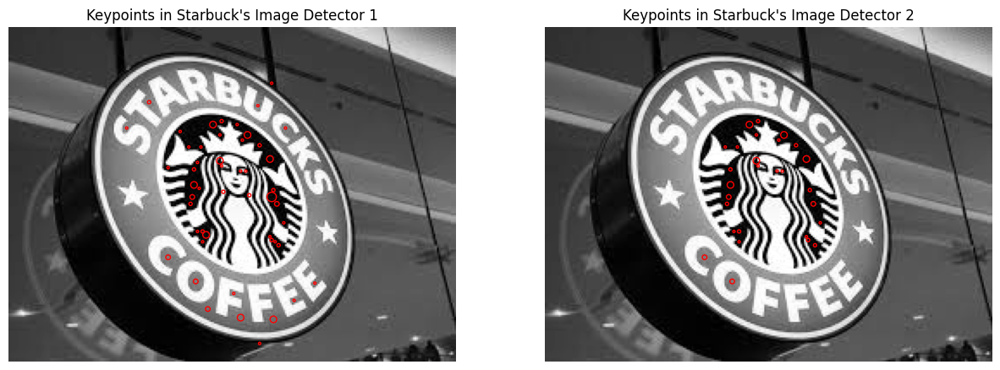

In [15]:
#Different parameters:
#Non_max_threshold = Remove the points with lower values than this value
#Line_threshold = Refuse interest points with more ratio curvatures than this value

def censure_method(images):
    images = transform_image(images)

    # Create censure changing differents parameters
    detector = CENSURE(non_max_threshold = .25, line_threshold=20)
    detector.detect(images)

    detector2 = CENSURE(non_max_threshold = .3, line_threshold=10)
    detector2.detect(images)

    plt.figure(figsize=(15, 15))

    plt.subplot(1, 2, 1)
    plt.imshow(images, cmap='gray')
    plt.scatter(detector.keypoints[:, 1], detector.keypoints[:, 0], 2 ** detector.scales, facecolors='none', edgecolors='r')
    plt.axis('off')
    plt.title("Keypoints in Starbuck's Image Detector 1")

    #Euclidean distance
    plt.subplot(1, 2, 2)
    plt.imshow(images, cmap='gray')
    plt.scatter(detector2.keypoints[:, 1], detector2.keypoints[:, 0],2 ** detector2.scales, facecolors='none', edgecolors='r')
    plt.axis('off')
    plt.title("Keypoints in Starbuck's Image Detector 2")


    plt.show()

starbucks = io.imread("images/starbucks4.jpg")
censure_method(starbucks)

**3.2 (10 points)** Detect the correspondences between the model image `starbucks.jpg` with the scene image `starbucks4.jpg`. You can adapt the code from the [ORB example](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_orb.html).

Define a function get_ORB implementing the algorithm in order to be able to apply it on different images. Comment the code in detail.

**Hint: If the function plot_matches() gives you an error you can use the plot_matches_aux() at the end of this file.**

Analyze and discuss the effect of different values of the parameter `max_ratio` in the match_descriptors function.


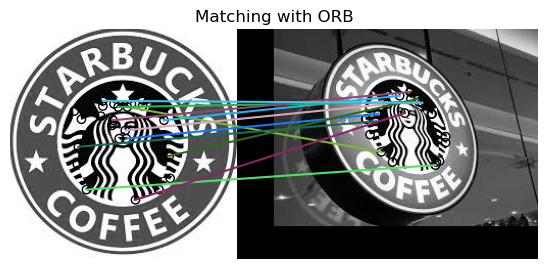

In [20]:
# Your solution here
def get_ORB(image, keypoints=25):
    #Create descriptor with parameters (keypoints)
    descriptor = ORB(n_keypoints=keypoints)

    #Detect keypoints
    descriptor.detect_and_extract(image)

    #Return keypoints and descriptor
    return descriptor.descriptors, descriptor.keypoints


def correspondences(template, image):
    template = transform_image(template)
    image = transform_image(image)

    #Get descriptors and keypoints of both images
    template_descriptors, template_keypoints = get_ORB(template)
    image_descriptors, image_keypoints = get_ORB(image)

    #Calculate matches
    matches = match_descriptors(template_descriptors, image_descriptors, cross_check=True)

    plt.figure(figsize=(15, 15))
    plt.subplot(1, 2, 1)
    plot_matches(plt, template, image, template_keypoints, image_keypoints, matches)
    plt.axis('off')
    plt.title("Matching with ORB")
    plt.show()

starbucks = io.imread("images/starbucks.jpg")
starbucks_2 = io.imread("images/starbucks4.jpg")

correspondences(starbucks, starbucks_2)

Repeate the experiment comparing the `starbucks.jpg` image as a model, and showing its matches to all Starbucks images, sorting them based on their similarity to the model. Comment when does the algorithm work better.

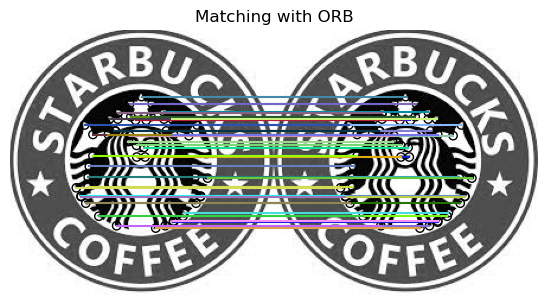

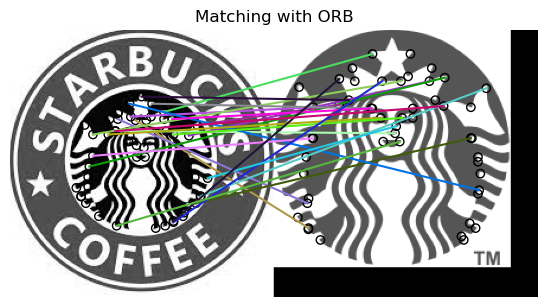

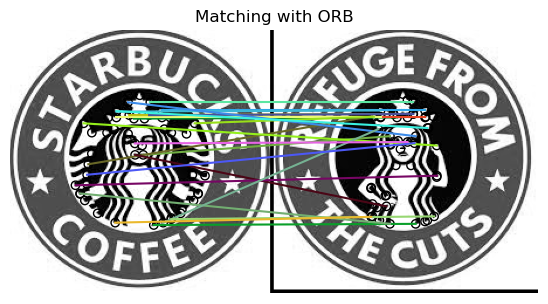

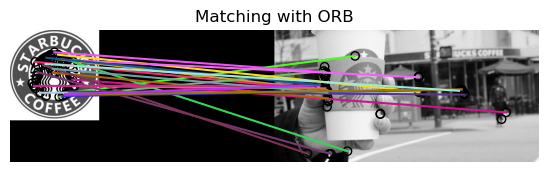

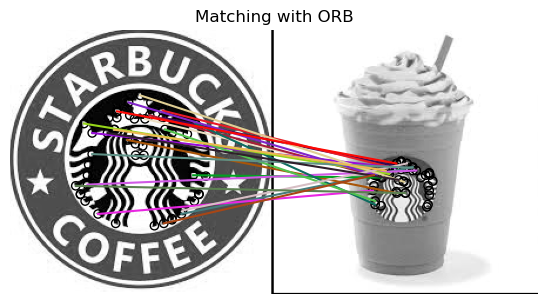

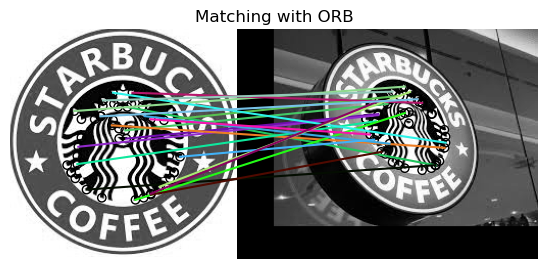

In [21]:
def compare_images(model, images, keypoints=50):
    model = transform_image(model)
    matches = []

    #Get ORB of model
    model_descriptors, model_keypoints = get_ORB(model, keypoints)
    #We take the image path of images
    for image in images:
        #We need to convert to float all images depending of the shape
        image = transform_image(image)

        #Get ORB for each image in starbucks
        image_descriptors, image_keypoints = get_ORB(image, keypoints)

        #Calculate match descriptors
        match = match_descriptors(model_descriptors, image_descriptors, cross_check=True)
        #Add in the list for plot
        matches.append([model, image, model_keypoints, image_keypoints, match])


    #Sort by match_descriptors
    matches.sort(key=lambda x: len(x[4]), reverse=True)

    #Print each one
    for match in matches:
        plt.figure(figsize=(15, 15))
        plt.subplot(1, 2, 1)

        plot_matches(plt, match[0], match[1], match[2], match[3], match[4])
        plt.axis('off')
        plt.title(f"Matching with ORB")
        plt.show()

starbucks = io.imread("images/starbucks.jpg")
starbucks_images = io.imread_collection('images/starbucks*')
compare_images(starbucks, starbucks_images)

**3.3 (5 points)** Repeat the experiment:
- Changing the orientation of the model image by rotating it and comparing it with its original version. Help: you can use the rotate() function from skimage.transform
- Change the scale and orientation of the scene image and compare it with the model image.

**Help:** To do so, you can use the function given below as example:

```
import transform as tf
rotationdegrees = 180
img_rotated = tf.rotate(image2transform, rotationdegrees)
```

or

```
tform = tf.AffineTransform(scale=(1.2, 1.2), translation=(0, -100), rotation=0.5)
img_transformed = tf.warp(image2transform, tform)
```

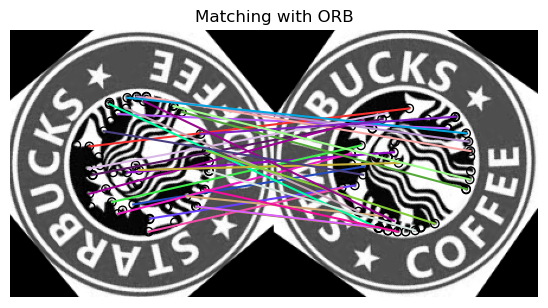

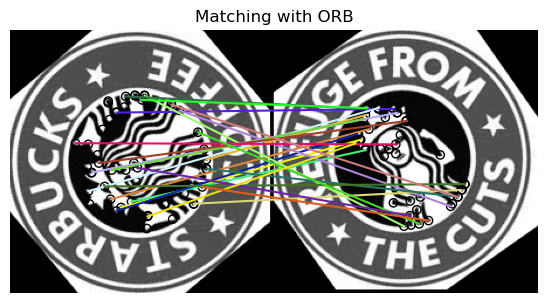

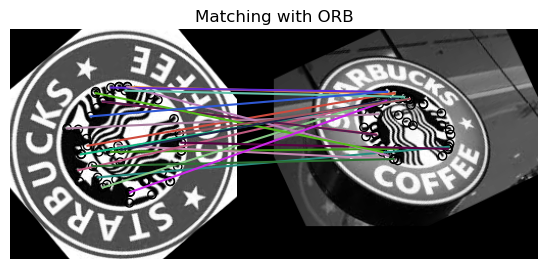

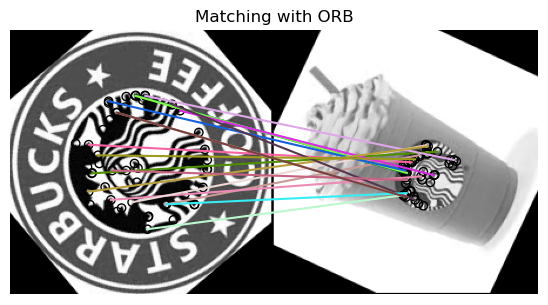

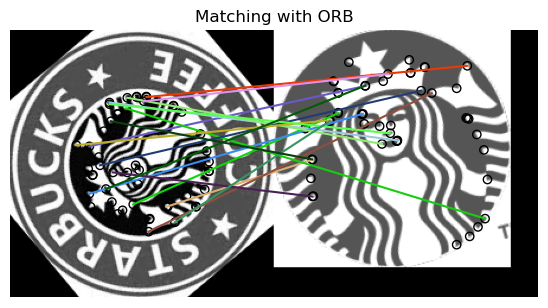

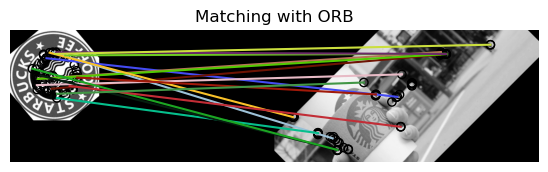

In [22]:
def rotate_model_images(model, images):
    #Rotate the model
    model_rotated = rotate(model, 130)

    images_rotated = []
    count = 0
    for image in images:
        images_rotated.append(rotate(image, 15+count))
        count += 10

    compare_images(model_rotated, images_rotated)

starbucks = io.imread("images/starbucks.jpg")
starbucks_images = io.imread_collection('images/starbucks*')
rotate_model_images(starbucks, starbucks_images)

**(Optional)** Repeat the experiment (3.1 to 3.3) with a new group of images. You could use Coca-Cola advertisements or from another famous brand, easily to find on internet.


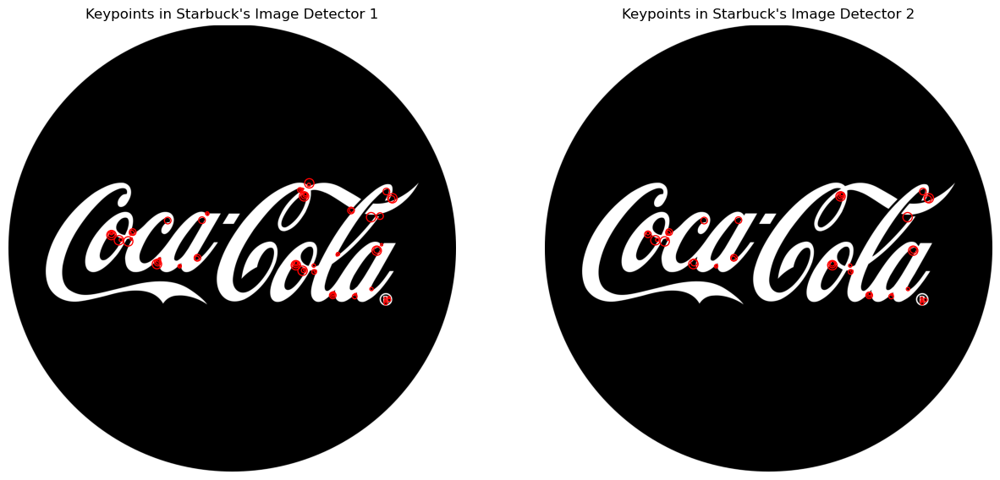

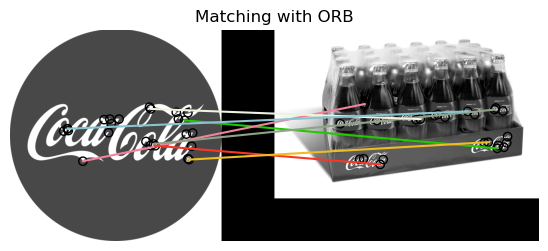

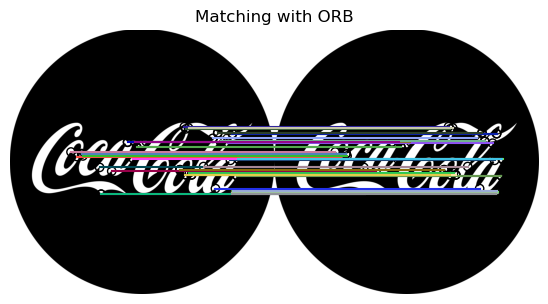

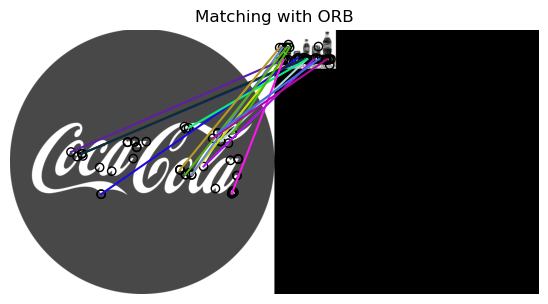

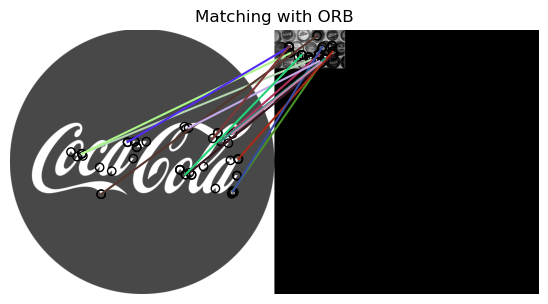

...

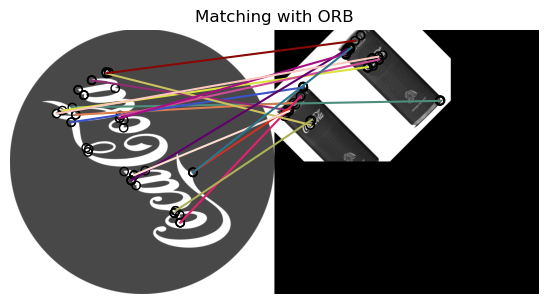

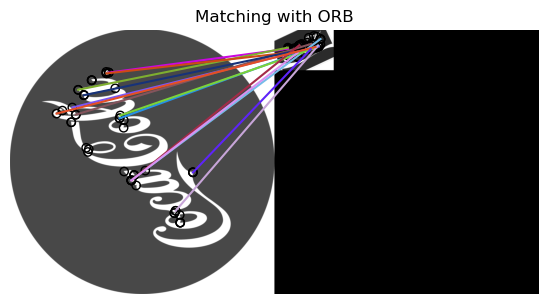

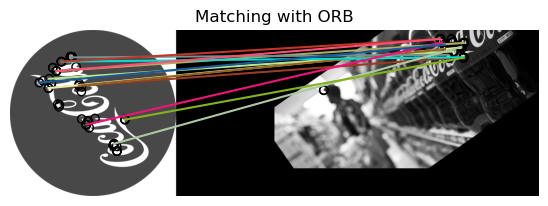

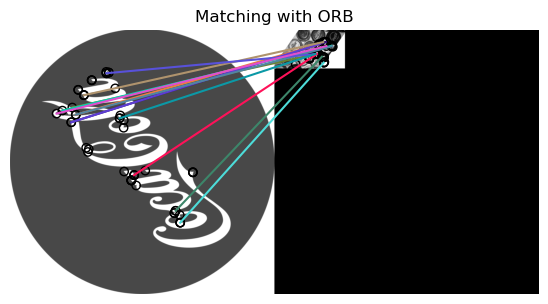

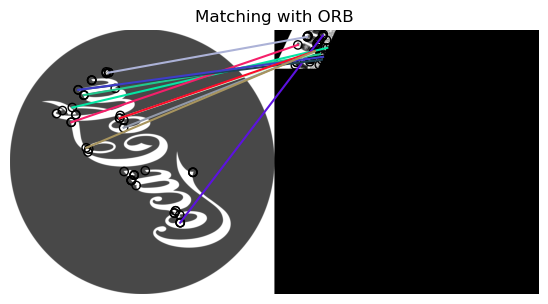

In [23]:
#3.1:
cocacola_model = io.imread("images/CocaColaImages/cocacola_logo.png")

censure_method(cocacola_model)

#3.2:
cocacola_2 = io.imread("images/CocaColaImages/cocacola1.jpg")
cocacola_images =  io.imread_collection('images/CocaColaImages/cocacola*')
correspondences(cocacola_model, cocacola_2)
compare_images(cocacola_model, cocacola_images)

#3.3:
cocacola_model = io.imread("images/CocaColaImages/cocacola_logo.png")
cocacola_images =  io.imread_collection('images/CocaColaImages/cocacola*')
rotate_model_images(cocacola_model, cocacola_images)

**3.4 (5 points)** Analysis of the applied techniques and results

- What are the advantages of the ORB object detection with respect to the HOG and template object detector?

- What would happen if you analyse an image that does not contain the Starbucks logo?

- Could you think of ways of defining a quality measure for the correspondance between two images? (no need of implementing it)

ORB is inherently rotation-invariant, making it effective in detecting objects at various orientations compared to HOG, which may struggle with rotated objects and it's scale invariant so it can detect objects at different scales.
ORB is also known for its computational efficiency, making it faster than HOG and template-based methods.

If you analyze an image that does not contain the Starbucks logo, the ORB object detector is likely to produce fewer or no matches because the Starbucks logo has distinctive features comparing to other logos.

Some ways of defining a quality measure for the correspondance between two images may be:
Number and quality of matched keypoints.
Ensuring that matched features align well.
Measure how consistently features are detected between multiple images

# 4. SIFT

**4.1 (5 points)** Now use SIFT to the same problem statement as 3.2 exercise, make sure to show the results with all starbucks images provided. For now, you can use the default parameters of SIFT.
* Compare the results and the running time of both algortihms.
* Which one works best on this case?

In this case it works better with ORB

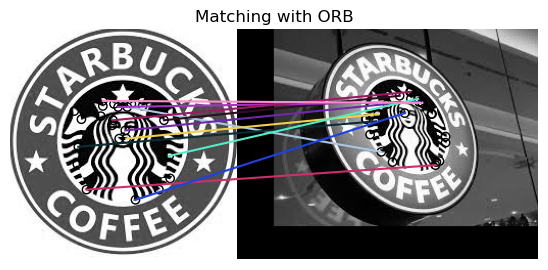

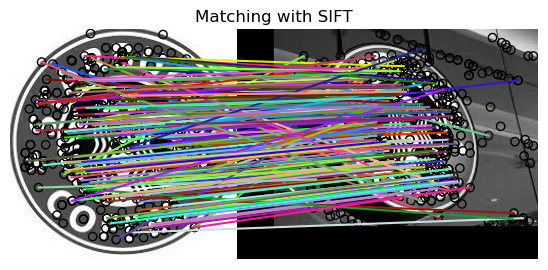

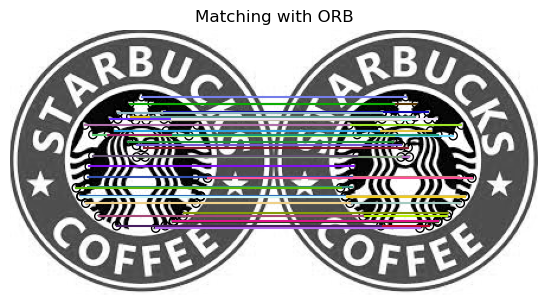

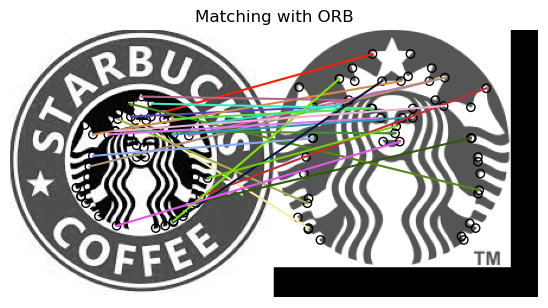

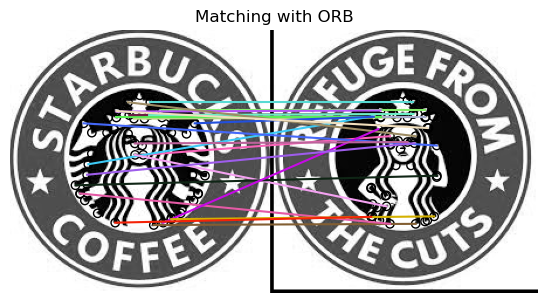

...

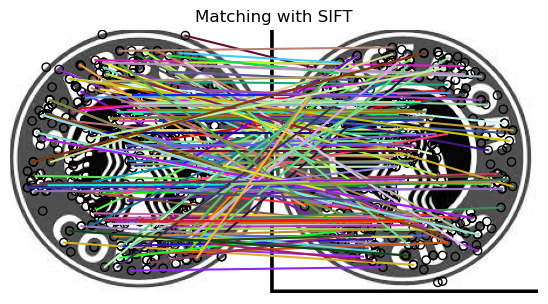

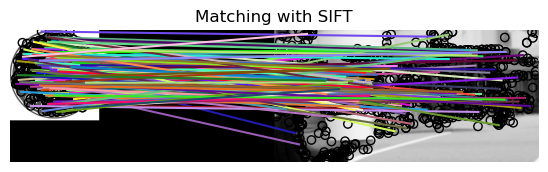

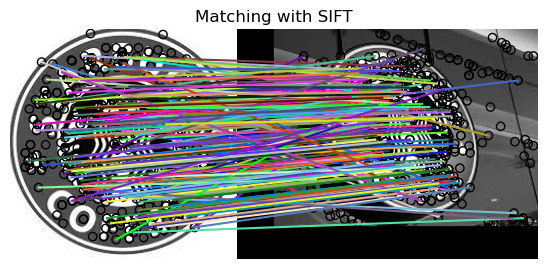

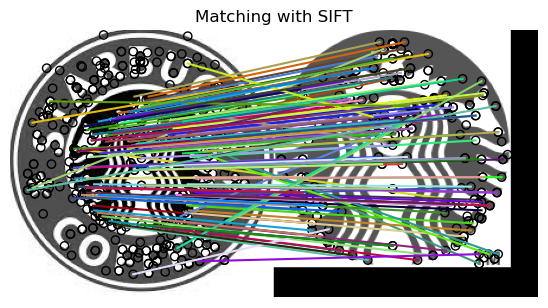

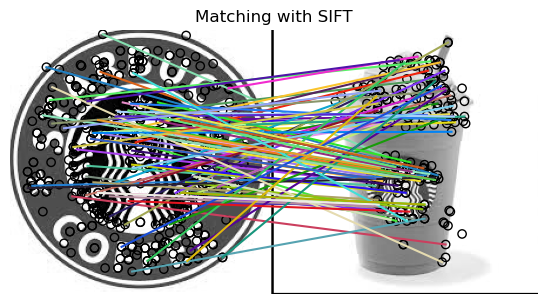

In [25]:
# Your solution
def get_SIFT(image):
    descriptor = SIFT()

    descriptor.detect_and_extract(image)

    return descriptor.descriptors, descriptor.keypoints

def get_ORB(image, keypoints=25):
    #Create descriptor with parameters (keypoints)
    descriptor = ORB(n_keypoints=keypoints)

    #Detect keypoints
    descriptor.detect_and_extract(image)

    #Return keypoints and descriptor
    return descriptor.descriptors, descriptor.keypoints

def correspondences(template, image, algorithm):
    template = transform_image(template)
    image = transform_image(image)

    if algorithm == 'ORB':
        #Get descriptors and keypoints of both images
        template_descriptors, template_keypoints = get_ORB(template)
        image_descriptors, image_keypoints = get_ORB(image)
    elif algorithm == 'SIFT':
                #Get descriptors and keypoints of both images
        template_descriptors, template_keypoints = get_SIFT(template)
        image_descriptors, image_keypoints = get_SIFT(image)

    #Calculate matches
    matches = match_descriptors(template_descriptors, image_descriptors, cross_check=True)

    plt.figure(figsize=(15, 15))
    plt.subplot(1, 2, 1)
    plot_matches(plt, template, image, template_keypoints, image_keypoints, matches)
    plt.axis('off')
    plt.title(f"Matching with {algorithm}")
    plt.show()

def compare_images(model, images, keypoints=50, algorithm='ORB'):
    model = transform_image(model)
    matches = []
    if algorithm=='ORB':
        #Get ORB of model
        model_descriptors, model_keypoints = get_ORB(model, keypoints)
        #We take the image path of images
        for image in images:
            #We need to convert to float all images depending of the shape
            image = transform_image(image)

            #Get ORB for each image in starbucks
            image_descriptors, image_keypoints = get_ORB(image, keypoints)

            #Calculate match descriptors
            match = match_descriptors(model_descriptors, image_descriptors, cross_check=True)
            #Add in the list for plot
            matches.append([model, image, model_keypoints, image_keypoints, match])

    elif algorithm == 'SIFT':
        #Get SIFT of model
        model_descriptors, model_keypoints = get_SIFT(model)
        #We take the image path of images
        for image in images:
            #We need to convert to float all images depending of the shape
            image = transform_image(image)

            #Get SIFT for each image in starbucks
            image_descriptors, image_keypoints = get_SIFT(image)

            #Calculate match descriptors
            match = match_descriptors(model_descriptors, image_descriptors, cross_check=True)
            #Add in the list for plot
            matches.append([model, image, model_keypoints, image_keypoints, match])

    #Sort by match_descriptors
    matches.sort(key=lambda x: len(x[4]), reverse=True)

    #Print each one
    for match in matches:
        plt.figure(figsize=(15, 15))
        plt.subplot(1, 2, 1)
        plot_matches(plt, match[0], match[1], match[2], match[3], match[4])
        plt.axis('off')
        plt.title(f"Matching with {algorithm}")
        plt.show()

starbucks = io.imread("images/starbucks.jpg")
starbucks_2 = io.imread("images/starbucks4.jpg")
correspondences(starbucks, starbucks_2, algorithm='ORB')
correspondences(starbucks, starbucks_2, algorithm='SIFT')

starbucks = io.imread("images/starbucks.jpg")
starbucks_images = io.imread_collection('images/starbucks*')
compare_images(starbucks, starbucks_images, algorithm='ORB')
compare_images(starbucks, starbucks_images, algorithm='SIFT')

**4.2 (10 points)** Analyze the different SIFT parameters. Try and show the results for at least 3 different combination of parameters for starbucks4.jpg image against starbucks model image.

* What are their effect?
    - Octaves: How many times the original image is downsampled
    - Sigma_min: Amount of smoothing
    - Scales: Number of scales per octave
* How do they compare to ORB parameters?
    - SIFT parameters offer a different way to control the scale and detail of keypoints against the ORB parameters (keypoints)
* Which algorithm is more suitable for images with rotation? And for images that have been rescaled, which one is more effective?
    - Rotation -> Both are suitable, but SIFT scale invariance do an advantatge in this cases
    - Rescaled -> SIFT is more effective for images that have been rescale
* When it comes to changes in image intensity, which algorithm performs better, ORB or SIFT?
    - SIFT performs better in handling changes in image intensity because it focuses on local structures and gradients, making it more robust

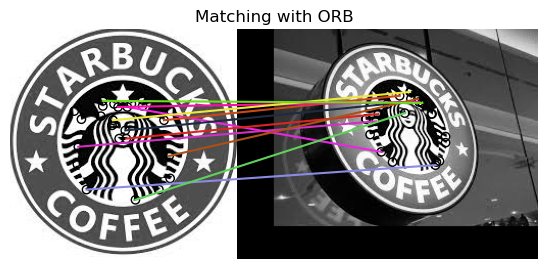

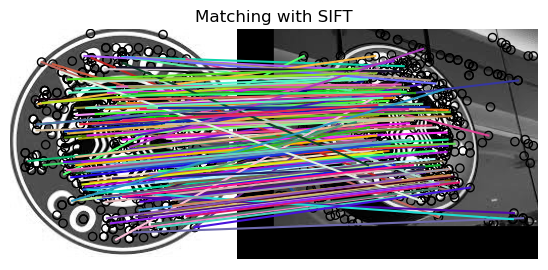

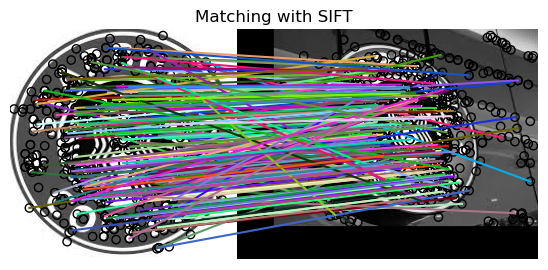

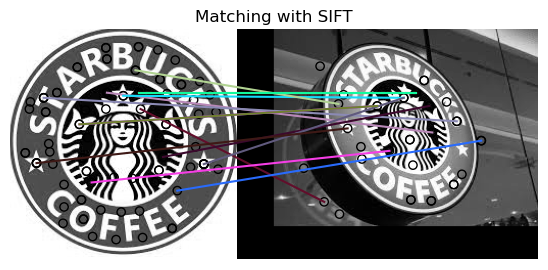

In [26]:
# Your solution
def get_SIFT_changed(image, octaves=3, sigma=1.6, scales=3):
    descriptor = SIFT(n_octaves=octaves, sigma_min=sigma, n_scales=scales)

    descriptor.detect_and_extract(image)

    return descriptor.descriptors, descriptor.keypoints

def correspondences(template, image, algorithm, octaves=3, sigma=1.6, scales=3):
    template = transform_image(template)
    image = transform_image(image)

    if algorithm == 'ORB':
        #Get descriptors and keypoints of both images
        template_descriptors, template_keypoints = get_ORB(template)
        image_descriptors, image_keypoints = get_ORB(image)
    elif algorithm == 'SIFT':
                #Get descriptors and keypoints of both images
        template_descriptors, template_keypoints = get_SIFT_changed(template, octaves, sigma, scales)
        image_descriptors, image_keypoints = get_SIFT_changed(image, octaves, sigma, scales)

    #Calculate matches
    matches = match_descriptors(template_descriptors, image_descriptors, cross_check=True)

    plt.figure(figsize=(15, 15))
    plt.subplot(1, 2, 1)
    plot_matches(plt, template, image, template_keypoints, image_keypoints, matches)
    plt.axis('off')
    plt.title(f"Matching with {algorithm}")
    plt.show()

starbucks = io.imread("images/starbucks.jpg")
starbucks_2 = io.imread("images/starbucks4.jpg")
correspondences(starbucks, starbucks_2, algorithm='ORB')
correspondences(starbucks, starbucks_2, algorithm='SIFT')
correspondences(starbucks, starbucks_2, algorithm='SIFT', octaves=5, sigma=1.6, scales=5)
correspondences(starbucks, starbucks_2, algorithm='SIFT', octaves=1, sigma=4, scales=1)

**4.3 (10 points)** Can we build an image classifier using the SIFT algorithm? Start by uploading the images from the folder `matches_SIFT`, then use the SIFT algorithm to find the most similar pairs (use the following parameters for this: max_ratio=0.8, upsampling=2, n_octaves=8, n_scales=3). To compare all the images, we'll need to establish a metric. We suggest to use the number of matches between images.

Show your results (SIFT result image matches and print the similarity only for the most similar image for each of the 6 images provided). Rescale the images to see the matches between images.

Answer the following: 
* Is the algorithm failing to find accurate matches (similar images) for some cases? If so, why do you think this is happening? You can assume that a good results is that eiffel tower images match between them and so on.
    - It fails in some cases

Here is an example of the expected results for ciudad_ciencias_1.jpg (you also have to print the similarity metric result): 

<img src="images/example_city_of_arts.png" width="400" height="300">

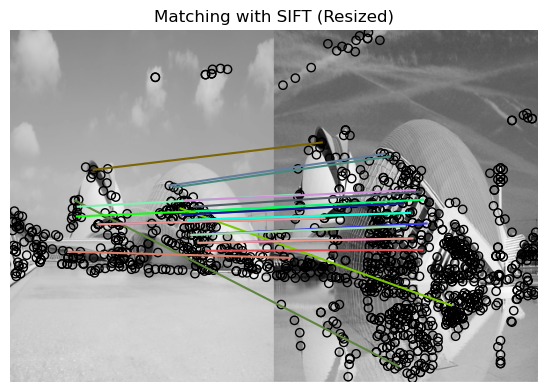

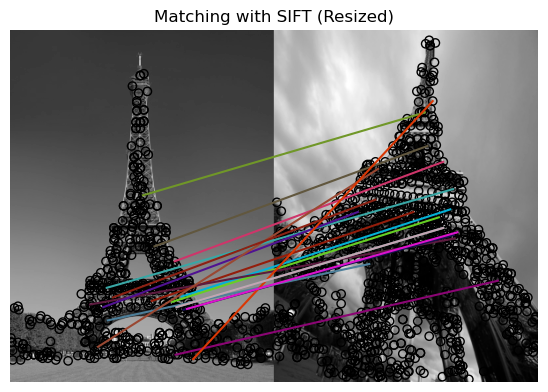

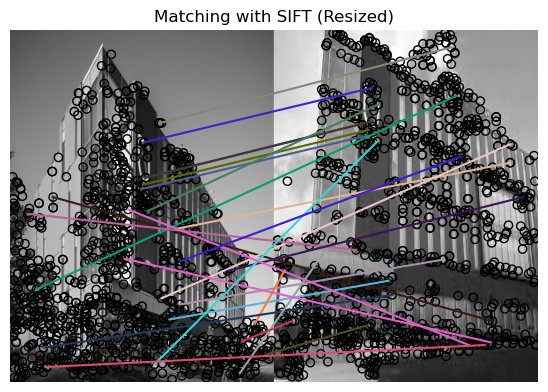

In [27]:
def get_SIFT_classifier(image, upsampling=2, n_octaves=8, scales=3):
    descriptor = SIFT(upsampling=upsampling, n_octaves=n_octaves, n_scales=scales)

    descriptor.detect_and_extract(image)

    return descriptor.descriptors, descriptor.keypoints

def correspondences_changed(template, image, octaves=3, max_ratio=0.8, upsampling=2, scales=3, resize_shape=(400, 300)):

    # Resize to same shape
    template_resized = resize(template, resize_shape, anti_aliasing=True)
    image_resized = resize(image, resize_shape, anti_aliasing=True)
    template_resized = transform_image(template_resized)
    image_resized = transform_image(image_resized)

    # SIFT
    template_descriptors, template_keypoints = get_SIFT_classifier(template_resized, upsampling, octaves, scales)
    image_descriptors, image_keypoints = get_SIFT_classifier(image_resized, upsampling, octaves, scales)

    # MATCHES
    matches = match_descriptors(template_descriptors, image_descriptors, cross_check=True, max_ratio=max_ratio)

    plt.figure(figsize=(15, 15))
    plt.subplot(1, 2, 1)
    plot_matches(plt, template_resized, image_resized, template_keypoints, image_keypoints, matches)
    plt.axis('off')
    plt.title(f"Matching with SIFT (Resized)")
    plt.show()



ciudad_ciencias_1 = io.imread("images/matches_SIFT/ciudad_ciencias_1.jpg")
ciudad_ciencias_2 = io.imread("images/matches_SIFT/ciudad_ciencias_2.jpg")
correspondences_changed(ciudad_ciencias_1, ciudad_ciencias_2)

eiffel_tower_1 = io.imread("images/matches_SIFT/eiffel_tower1.jpg")
eiffel_tower_2 = io.imread("images/matches_SIFT/eiffel_tower2.jpg")
correspondences_changed(eiffel_tower_1, eiffel_tower_2)

ontario_1 = io.imread("images/matches_SIFT/ontario1.jpg")
ontario_2 = io.imread("images/matches_SIFT/ontario2.jpeg")
correspondences_changed(ontario_1, ontario_2)

### Appendix

In [28]:
# In case the plot_matches() function gives you some problems, you can use the following one:

from skimage.util import img_as_float
import numpy as np

def plot_matches_aux(ax, image1, image2, keypoints1, keypoints2, matches,
                 keypoints_color='k', matches_color=None, only_matches=False):
    """Plot matched features.
    Parameters
    ----------
    ax : matplotlib.axes.Axes
        Matches and image are drawn in this ax.
    image1 : (N, M [, 3]) array
        First grayscale or color image.
    image2 : (N, M [, 3]) array
        Second grayscale or color image.
    keypoints1 : (K1, 2) array
        First keypoint coordinates as ``(row, col)``.
    keypoints2 : (K2, 2) array
        Second keypoint coordinates as ``(row, col)``.
    matches : (Q, 2) array
        Indices of corresponding matches in first and second set of
        descriptors, where ``matches[:, 0]`` denote the indices in the first
        and ``matches[:, 1]`` the indices in the second set of descriptors.
    keypoints_color : matplotlib color, optional
        Color for keypoint locations.
    matches_color : matplotlib color, optional
        Color for lines which connect keypoint matches. By default the
        color is chosen randomly.
    only_matches : bool, optional
        Whether to only plot matches and not plot the keypoint locations.
    """

    image1 = img_as_float(image1)
    image2 = img_as_float(image2)

    new_shape1 = list(image1.shape)
    new_shape2 = list(image2.shape)

    if image1.shape[0] < image2.shape[0]:
        new_shape1[0] = image2.shape[0]
    elif image1.shape[0] > image2.shape[0]:
        new_shape2[0] = image1.shape[0]

    if image1.shape[1] < image2.shape[1]:
        new_shape1[1] = image2.shape[1]
    elif image1.shape[1] > image2.shape[1]:
        new_shape2[1] = image1.shape[1]

    if new_shape1 != image1.shape:
        new_image1 = np.zeros(new_shape1, dtype=image1.dtype)
        new_image1[:image1.shape[0], :image1.shape[1]] = image1
        image1 = new_image1

    if new_shape2 != image2.shape:
        new_image2 = np.zeros(new_shape2, dtype=image2.dtype)
        new_image2[:image2.shape[0], :image2.shape[1]] = image2
        image2 = new_image2

    image = np.concatenate([image1, image2], axis=1)

    offset = image1.shape

    if not only_matches:
        ax.scatter(keypoints1[:, 1], keypoints1[:, 0],
                   facecolors='none', edgecolors=keypoints_color)
        ax.scatter(keypoints2[:, 1] + offset[1], keypoints2[:, 0],
                   facecolors='none', edgecolors=keypoints_color)

    ax.imshow(image, interpolation='nearest', cmap='gray')
    ax.axis((0, 2 * offset[1], offset[0], 0))

    for i in range(matches.shape[0]):
        idx1 = matches[i, 0]
        idx2 = matches[i, 1]

        if matches_color is None:
            color = np.random.rand(3)
        else:
            color = matches_color

        ax.plot((keypoints1[idx1, 1], keypoints2[idx2, 1] + offset[1]),
                (keypoints1[idx1, 0], keypoints2[idx2, 0]),
                '-', color=color)